In [1]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import math
import matplotlib.pyplot as plt
data = pd.read_csv('listings.csv', delimiter=",")
initial_data=data

# Choosing features

selected_columns=data[['id','longitude','latitude','host_is_superhost','accommodates','beds','amenities','number_of_reviews','review_scores_rating','room_type','neighbourhood_cleansed','price']].copy()
#print(selected_columns.shape)

# Droping NaN samples

selected_columns=selected_columns.dropna()
selected_columns=selected_columns.reset_index(drop=True)


#print(selected_columns.shape)

# Replace characters T F with 1 0
selected_columns['host_is_superhost']=selected_columns['host_is_superhost'].replace('t',1)
selected_columns['host_is_superhost']=selected_columns['host_is_superhost'].replace('f',0)

selected_columns['beds']=selected_columns['beds'].astype(int)

# Amenities feature encoding (sum number of amenities)

for i in range(len(selected_columns['amenities'])):
    counter=selected_columns['amenities'][i].count(",") + 1
    selected_columns['amenities'][i]=counter


selected_columns['amenities']=selected_columns['amenities'].astype(int)
selected_columns['review_scores_rating']=selected_columns['review_scores_rating'].astype(int)

# LABEL ENCODING room_type

rt = preprocessing.LabelEncoder()
rt.fit(["Private room", "Entire home/apt", "Hotel room", "Shared room"])
#print(list(rt.classes_))
selected_columns['room_type']=rt.transform(selected_columns['room_type'])

# LABEL ENCODING neighbourhood_cleansed

nbhc = preprocessing.LabelEncoder()
nbhc.fit(['Oostelijk Havengebied - Indische Buurt', 'Centrum-Oost',
       'Centrum-West', 'Zuid', 'De Pijp - Rivierenbuurt',
       'De Baarsjes - Oud-West', 'Bos en Lommer', 'Westerpark',
       'Oud-Oost', 'Noord-West', 'Slotervaart', 'Oud-Noord',
       'Geuzenveld - Slotermeer', 'Watergraafsmeer',
       'IJburg - Zeeburgereiland', 'Noord-Oost', 'Gaasperdam - Driemond',
       'Buitenveldert - Zuidas', 'De Aker - Nieuw Sloten', 'Osdorp',
       'Bijlmer-Centrum', 'Bijlmer-Oost'])
#print(list(nbhc.classes_))
selected_columns['neighbourhood_cleansed']=nbhc.transform(selected_columns['neighbourhood_cleansed'])

# Removing $ symbol and converting to float
selected_columns['price']=selected_columns['price'].str.strip('$')
selected_columns['price']=selected_columns['price'].str.replace(',','')
selected_columns['price']=selected_columns['price'].astype(float)


<ipython-input-1-823a1b0fb85c>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_columns['amenities'][i]=counter


In [2]:
y=selected_columns['price'].copy()
y=pd.DataFrame(y)

In [3]:
# OUTLIERS DETECTION

from sklearn.ensemble import IsolationForest
model_if = IsolationForest(max_samples='auto', contamination=float(0.1))
model_if.fit(y)

y_pred_outliers = model_if.predict(y)
counts = np.unique(y_pred_outliers, return_counts=True)

In [4]:
sel_wo_out=selected_columns.copy()

In [5]:
for i in range(len(selected_columns)):
    if y_pred_outliers[i]==-1:
        sel_wo_out=sel_wo_out.drop(index=i)

In [6]:
selected=sel_wo_out

In [8]:
plotting_sc=selected[['id','longitude','latitude','accommodates','price']].copy()

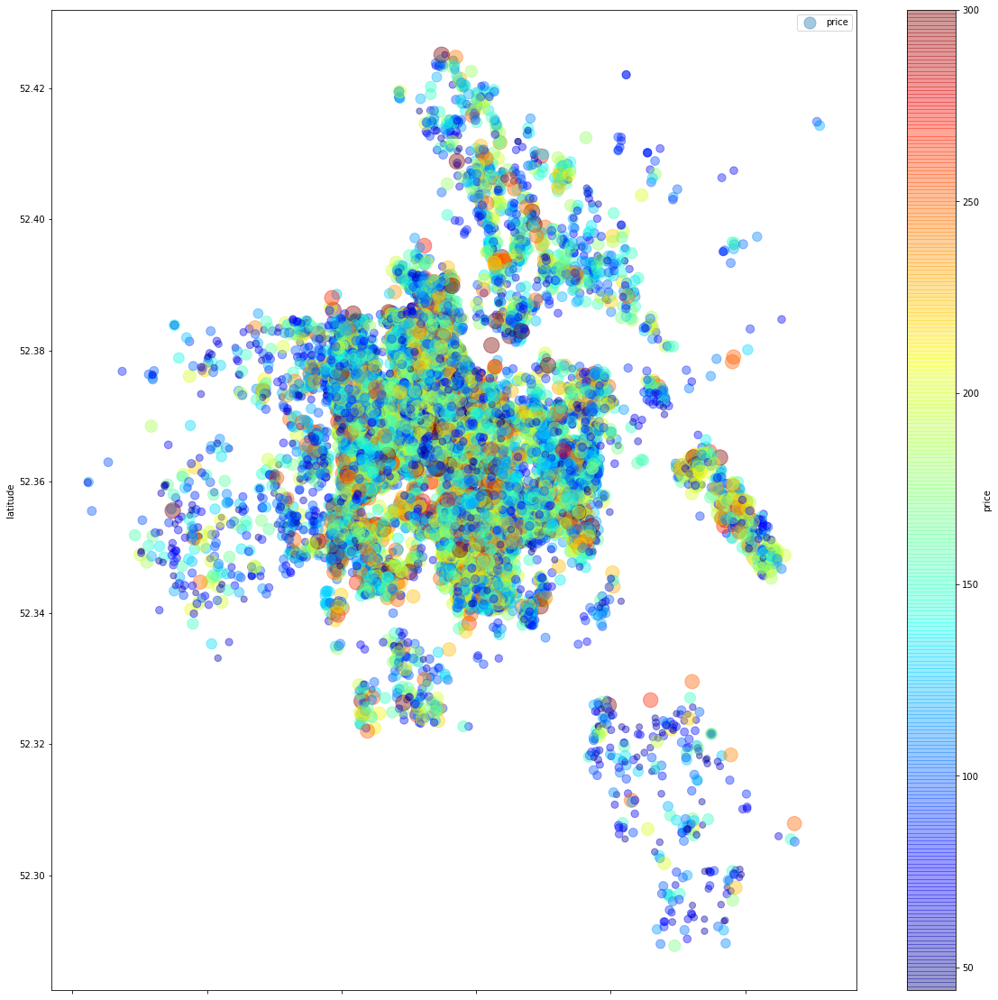

In [9]:
plotting_sc.plot(kind="scatter", x="longitude", y="latitude", s=selected['price'], label="price",
    c='price', cmap=plt.get_cmap("jet"), colorbar=True, alpha=0.4, figsize=(20,20),)
plt.legend()
plt.show()

In [10]:
# PREPARATION 
y=selected.pop('price')
X=selected
X=X.drop(columns=['id', 'longitude','latitude'])

In [28]:
feature_list=['Superhost','Accommodates','Beds','Amenities','Reviews','Review Scores','Room type','Neighbourhood']

Feature: Superhost, Score: 2.08413
Feature: Accommodates, Score: 16.29001
Feature: Beds, Score: 0.65629
Feature: Amenities, Score: 0.86077
Feature: Reviews, Score: -0.07113
Feature: Review Scores, Score: 0.41942
Feature: Room type, Score: -20.25355
Feature: Neighbourhood, Score: -0.43451


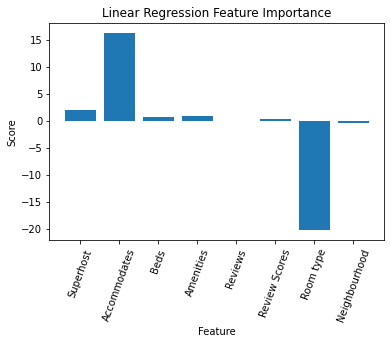

In [29]:
# Linear Regression
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot

# define the model
model_lr = LinearRegression()
# fit the model
model_lr.fit(X, y)
# get importance
importance_lr = model_lr.coef_
# summarize feature importance
for i,v in enumerate(importance_lr):
	print('Feature: %s, Score: %.5f' % (feature_list[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_lr))], importance_lr)
pyplot.xticks(ticks = range(0,len(importance_lr)) ,labels = feature_list, rotation = 70)
pyplot.ylabel('Score')
pyplot.xlabel('Feature')
pyplot.title('Linear Regression Feature Importance')
pyplot.show()

Coefficients: 
 [-13.48556322  20.77708426  -2.12019456   1.00202383  -0.27742782]
MAE: 37.46443172413875
MSE: 2246.978386172402
RMSE: 47.402303595631324


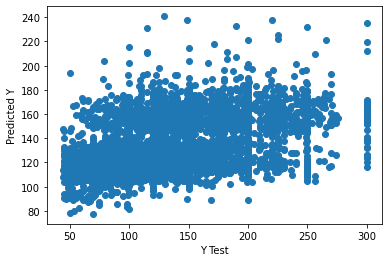

In [31]:
x=X[['host_is_superhost','accommodates','beds','amenities','neighbourhood_cleansed']]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)

model_lr1 = LinearRegression()
model_lr1.fit(X_train,y_train)

print('Coefficients: \n', model_lr1.coef_)
predictions = model_lr1.predict(X_test)
plt.scatter(y_test,predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

Feature: Superhost, Score: 0.01621
Feature: Accommodates, Score: 0.22069
Feature: Beds, Score: 0.04732
Feature: Amenities, Score: 0.18960
Feature: Reviews, Score: 0.19724
Feature: Review Scores, Score: 0.10762
Feature: Room type, Score: 0.10997
Feature: Neighbourhood, Score: 0.11135


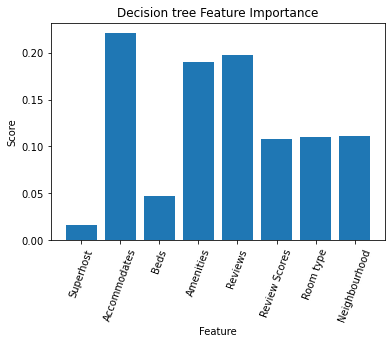

In [14]:
# decision tree for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot

# define the model
model_dtr = DecisionTreeRegressor()
# fit the model
model_dtr.fit(X, y)
# get importance
importance_dtr = model_dtr.feature_importances_
for i,v in enumerate(importance_dtr):
	print('Feature: %s, Score: %.5f' % (feature_list[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_dtr))], importance_dtr)
pyplot.xticks(ticks = range(0,len(importance_lr)) ,labels = feature_list, rotation = 70)
pyplot.ylabel('Score')
pyplot.xlabel('Feature')
pyplot.title('Decision tree Feature Importance')
pyplot.show()

MAE: 43.21694771904
MSE: 3150.2041531200707
RMSE: 56.12667951268871


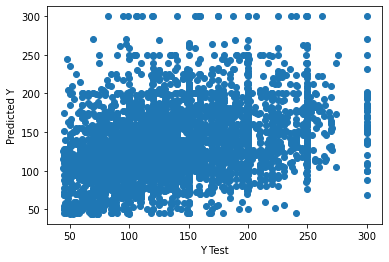

In [32]:
x=X[['accommodates','amenities','number_of_reviews']]

#Spliting the dataset into train(70%) and test(30%) using random sampling 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)

from sklearn.tree import DecisionTreeRegressor

# define the model
model_dtr1 = DecisionTreeRegressor()

# fit the model
model_dtr1.fit(x_train, y_train)
pred_dtr1 = model_dtr1.predict(x_test)


plt.scatter(y_test,pred_dtr1)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred_dtr1))
print('MSE:', metrics.mean_squared_error(y_test,pred_dtr1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_dtr1)))


Feature: Superhost, Score: 0.01588
Feature: Accommodates, Score: 0.21880
Feature: Beds, Score: 0.04963
Feature: Amenities, Score: 0.18356
Feature: Reviews, Score: 0.20092
Feature: Review Scores, Score: 0.10711
Feature: Room type, Score: 0.10861
Feature: Neighbourhood, Score: 0.11550


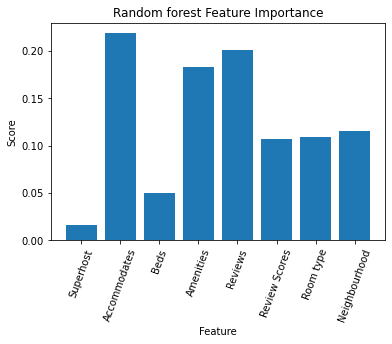

In [16]:
# random forest for feature importance on a regression problem
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot

# define the model
model_rfr = RandomForestRegressor()
# fit the model
model_rfr.fit(X, y)
# get importance
importance_rfr=model_rfr.feature_importances_
# summarize feature importance
for i,v in enumerate(importance_rfr):
	print('Feature: %s, Score: %.5f' % (feature_list[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_rfr))], importance_rfr)
pyplot.xticks(ticks = range(0,len(importance_lr)) ,labels = feature_list, rotation = 70)
pyplot.ylabel('Score')
pyplot.xlabel('Feature')
pyplot.title('Random forest Feature Importance')
pyplot.show()


MAE: 37.86791840014041
MSE: 2381.883673788791
RMSE: 48.80454562629173


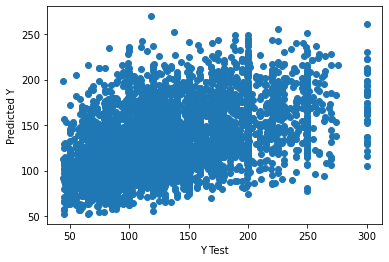

In [35]:
x=X[['accommodates','amenities','number_of_reviews','neighbourhood_cleansed']]

#Spliting the dataset into train(70%) and test(30%) using random sampling 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)


from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot

# define the model
model_rfr1 = RandomForestRegressor()


# fit the model
model_rfr1.fit(x_train, y_train)
pred_rfr1 = model_rfr1.predict(x_test)


plt.scatter(y_test,pred_rfr1)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred_rfr1))
print('MSE:', metrics.mean_squared_error(y_test,pred_rfr1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_rfr1)))




Feature: Superhost, Score: -0.44965
Feature: Accommodates, Score: 350.72536
Feature: Beds, Score: 149.56218
Feature: Amenities, Score: 902.45741
Feature: Reviews, Score: 936.18224
Feature: Review Scores, Score: 496.25405
Feature: Room type, Score: 154.02152
Feature: Neighbourhood, Score: 753.70387


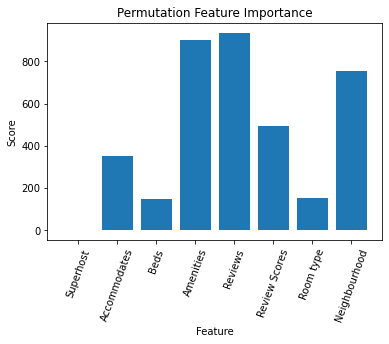

In [36]:
# permutation feature importance with knn for regression
from sklearn.datasets import make_regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance
from matplotlib import pyplot

# define the model
model_perm = KNeighborsRegressor()
# fit the model
model_perm.fit(X, y)
# perform permutation importance
results_perm = permutation_importance(model_perm, X, y, scoring='neg_mean_squared_error')
# get importance
importance_perm = results_perm.importances_mean
# summarize feature importance
for i,v in enumerate(importance_perm):
	print('Feature: %s, Score: %.5f' % (feature_list[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_perm))], importance_perm)
pyplot.xticks(ticks = range(0,len(importance_perm)) ,labels = feature_list, rotation = 70)
pyplot.ylabel('Score')
pyplot.xlabel('Feature')
pyplot.title('Permutation Feature Importance')
pyplot.show()





MAE: 39.675416552978625
MSE: 2571.524436142792
RMSE: 50.71020051373088


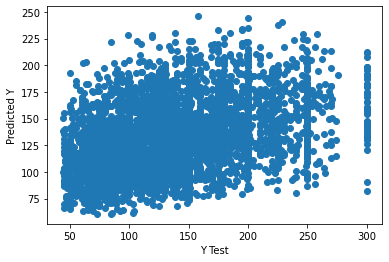

In [37]:
x=X[['accommodates','beds','amenities','number_of_reviews',
'review_scores_rating','neighbourhood_cleansed']]

#Spliting the dataset into train(70%) and test(30%) using random sampling 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)

from sklearn.neighbors import KNeighborsRegressor

# define the model
model_perm1 = KNeighborsRegressor()

# fit the model
model_perm1.fit(x_train, y_train)
pred_perm1 = model_perm1.predict(x_test)



plt.scatter(y_test,pred_perm1)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred_perm1))
print('MSE:', metrics.mean_squared_error(y_test,pred_perm1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_perm1)))







Feature: Superhost, Score: 0.02056
Feature: Accommodates, Score: 0.32492
Feature: Beds, Score: 0.03529
Feature: Amenities, Score: 0.03577
Feature: Reviews, Score: 0.02857
Feature: Review Scores, Score: 0.03262
Feature: Room type, Score: 0.46489
Feature: Neighbourhood, Score: 0.05738


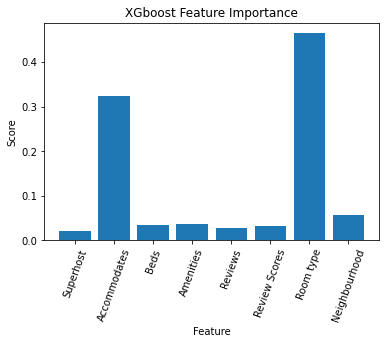

In [38]:
# xgboost for feature importance on a regression problem
from sklearn.datasets import make_regression
from xgboost import XGBRegressor
from matplotlib import pyplot

# define the model
model_xgb = XGBRegressor()
# fit the model
model_xgb.fit(X, y)
# get importance
importance_xgb = model_xgb.feature_importances_
# summarize feature importance
for i,v in enumerate(importance_xgb):
	print('Feature: %s, Score: %.5f' % (feature_list[i],v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_xgb))], importance_xgb)
pyplot.xticks(ticks = range(0,len(importance_xgb)) ,labels = feature_list, rotation = 70)
pyplot.ylabel('Score')
pyplot.xlabel('Feature')
pyplot.title('XGboost Feature Importance')
pyplot.show()

MAE: 34.643264322424
MSE: 2008.8834224054442
RMSE: 44.8205691887714


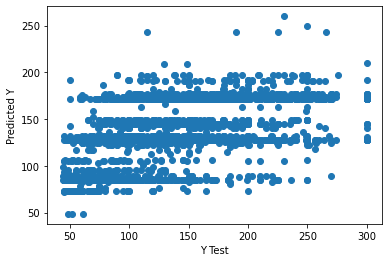

In [39]:
x=X[['accommodates','beds','room_type']]

#Spliting the dataset into train(70%) and test(30%) using random sampling 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)

import xgboost
from xgboost import XGBRegressor

# define the model
model_xgb1 = XGBRegressor()
# fit the model
model_xgb1.fit(x_train, y_train)
pred_xgb1 = model_xgb1.predict(x_test)

plt.scatter(y_test,pred_xgb1)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred_xgb1))
print('MSE:', metrics.mean_squared_error(y_test,pred_xgb1))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_xgb1)))

In [22]:
pred_xgb1a=model_xgb1.predict(x)
differences=pred_xgb1a-y
selected['differences70%3F']=differences.tolist()
selected['differences70%3F']

0         29.992981
1       -149.991386
2          6.477676
3        -51.991386
4         11.008614
            ...    
16147     56.834831
16148    -45.991386
16149    -45.991386
16150     37.139824
16151     33.992981
Name: differences70%3F, Length: 14585, dtype: float64

MAE: 34.12182810480839
MSE: 1943.3870970554121
RMSE: 44.08386436163931


0         31.450264
1       -150.263260
2          5.919876
3        -52.263260
4         10.736740
            ...    
16147     55.370956
16148    -46.263260
16149    -46.263260
16150     38.665474
16151     35.450264
Name: differences100%3F, Length: 14585, dtype: float64

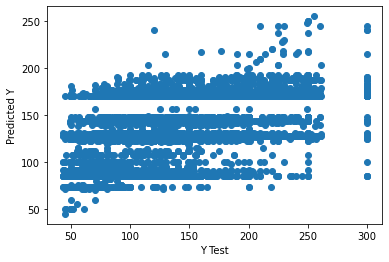

In [23]:
x=X[['accommodates','beds','room_type']]


import xgboost
from xgboost import XGBRegressor

# define the model
model_xgb2 = XGBRegressor()
# fit the model
model_xgb2.fit(x,y)
pred_xgb2 = model_xgb2.predict(x)
plt.scatter(y,pred_xgb2)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y, pred_xgb2))
print('MSE:', metrics.mean_squared_error(y,pred_xgb2))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y, pred_xgb2)))

differences2=pred_xgb2-y
selected['differences100%3F']=differences2.tolist()
selected['differences100%3F']


MAE: 32.98928670126516
MSE: 1870.5988143751733
RMSE: 43.250419817328634


0         5.049461
1       -28.510452
2        51.109390
3       -40.108315
4        12.644516
           ...    
16147    37.689903
16148   -32.860367
16149   -27.577682
16150    30.158913
16151    28.048271
Name: differences70%8F, Length: 14585, dtype: float64

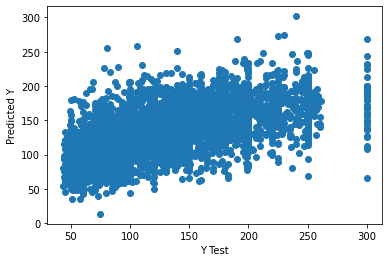

In [24]:
x=X[['host_is_superhost','accommodates','beds','amenities','number_of_reviews','review_scores_rating','room_type','neighbourhood_cleansed']]


import xgboost
from xgboost import XGBRegressor

#Spliting the dataset into train(70%) and test(30%) using random sampling 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=101)

# define the model
model_xgb_af = XGBRegressor()
# fit the model
model_xgb_af.fit(x_train,y_train)
pred_xgbaf = model_xgb_af.predict(x_test)

plt.scatter(y_test,pred_xgbaf)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred_xgbaf))
print('MSE:', metrics.mean_squared_error(y_test,pred_xgbaf))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_xgbaf)))

pred_xgbaf=model_xgb_af.predict(x)
differences3=pred_xgbaf-y
selected['differences70%8F']=differences3.tolist()
selected['differences70%8F']


MAE: 25.972277180909376
MSE: 1185.4570705592778
RMSE: 34.43046718473738


0        14.233353
1       -38.156921
2        45.116013
3       -44.314514
4        15.263245
           ...    
16147    45.771706
16148   -18.550407
16149   -17.527817
16150    48.145081
16151    24.318985
Name: differences100%8F, Length: 14585, dtype: float64

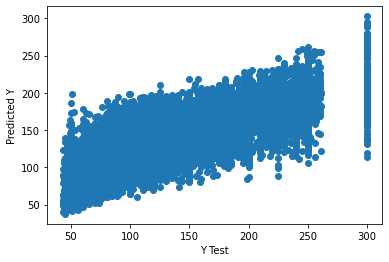

In [25]:
x=X[['host_is_superhost','accommodates','beds','amenities','number_of_reviews','review_scores_rating','room_type','neighbourhood_cleansed']]


import xgboost
from xgboost import XGBRegressor

# define the model
model_xgb_af100 = XGBRegressor()
# fit the model
model_xgb_af100.fit(x,y)
pred_xgbaf100 = model_xgb_af100.predict(x)

plt.scatter(y,pred_xgbaf100)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
from sklearn import metrics
#calculate metrics
print('MAE:', metrics.mean_absolute_error(y, pred_xgbaf100))
print('MSE:', metrics.mean_squared_error(y,pred_xgbaf100))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y, pred_xgbaf100)))


differences4=pred_xgbaf100-y
selected['differences100%8F']=differences4.tolist()
selected['differences100%8F']


In [26]:
final=selected[['id','differences100%8F']]

In [27]:
final

,id,differences100%8F
0,2818,14.233353
1,20168,-38.156921
2,25428,45.116013
3,27886,-44.314514
4,28871,15.263245
...,...,...
16147,45525740,45.771706
16148,45586950,-18.550407
16149,45589621,-17.527817
16150,45591405,48.145081


In [28]:
final.sort_values(by='differences100%8F')

,id,differences100%8F
14520,36970315,-185.444824
15806,42855140,-180.364655
13469,32806990,-168.252274
4667,11000587,-164.003250
12224,28020858,-162.025223
...,...,...
2569,5964100,118.129471
13259,31902775,121.844956
1615,3516586,122.866531
11477,25754779,135.903641


In [29]:
final=final.astype(int)

In [30]:
final

,id,differences100%8F
0,2818,14
1,20168,-38
2,25428,45
3,27886,-44
4,28871,15
...,...,...
16147,45525740,45
16148,45586950,-18
16149,45589621,-17
16150,45591405,48


In [31]:
final.sort_values(by='differences100%8F')

,id,differences100%8F
14520,36970315,-185
15806,42855140,-180
13469,32806990,-168
4667,11000587,-164
12224,28020858,-162
...,...,...
2569,5964100,118
13259,31902775,121
1615,3516586,122
11477,25754779,135


In [32]:
final.to_csv(path_or_buf="/Users/Nikos/Desktop/ML_Project_VSC/final.csv")

In [33]:
selected=selected.astype(int)

In [34]:
selected.to_csv(path_or_buf="/Users/Nikos/Desktop/ML_Project_VSC/selected.csv")